# Agrupación de todo el Periodo

In [1]:
library(loadeR)
library(transformeR)
library(visualizeR)

Warning message:
"package 'loadeR' was built under R version 3.6.3"Loading required package: rJava
Warning message:
"package 'rJava' was built under R version 3.6.3"Loading required package: loadeR.java
Warning message:
"package 'loadeR.java' was built under R version 3.6.3"Java version 21x amd64 by Azul Systems, Inc. detected
NetCDF Java Library v4.6.0-SNAPSHOT (23 Apr 2015) loaded and ready
Loading required package: climate4R.UDG
Warning message:
"package 'climate4R.UDG' was built under R version 3.6.3"climate4R.UDG version 0.2.6 (2023-06-26) is loaded
Please use 'citation("climate4R.UDG")' to cite this package.
loadeR version 1.8.1 (2023-06-22) is loaded
Please use 'citation("loadeR")' to cite this package.
Warning message:
"package 'transformeR' was built under R version 3.6.3"


    _______   ____  ___________________  __  ________ 
   / ___/ /  / /  |/  / __  /_  __/ __/ / / / / __  / 
  / /  / /  / / /|_/ / /_/ / / / / __/ / /_/ / /_/_/  
 / /__/ /__/ / /  / / __  / / / / /__ /___  / / \ \ 
 \___/____/_/_/  /_/_/ /_/ /_/  \___/    /_/\/   \_\ 
 
      github.com/SantanderMetGroup/climate4R



transformeR version 2.2.2 (2023-10-26) is loaded
Please see 'citation("transformeR")' to cite this package.
Warning message:
"package 'visualizeR' was built under R version 3.6.3"visualizeR version 1.6.4 (2023-10-26) is loaded
Please see 'citation("visualizeR")' to cite this package.


# Import Data

In [21]:
sum10 <- readRDS("../4_sum_CE/sum_CE_0.1_35.rds")

In [3]:
capa_tierra <- readRDS("../capa_tierra.rds")

### Prueba un año concreto

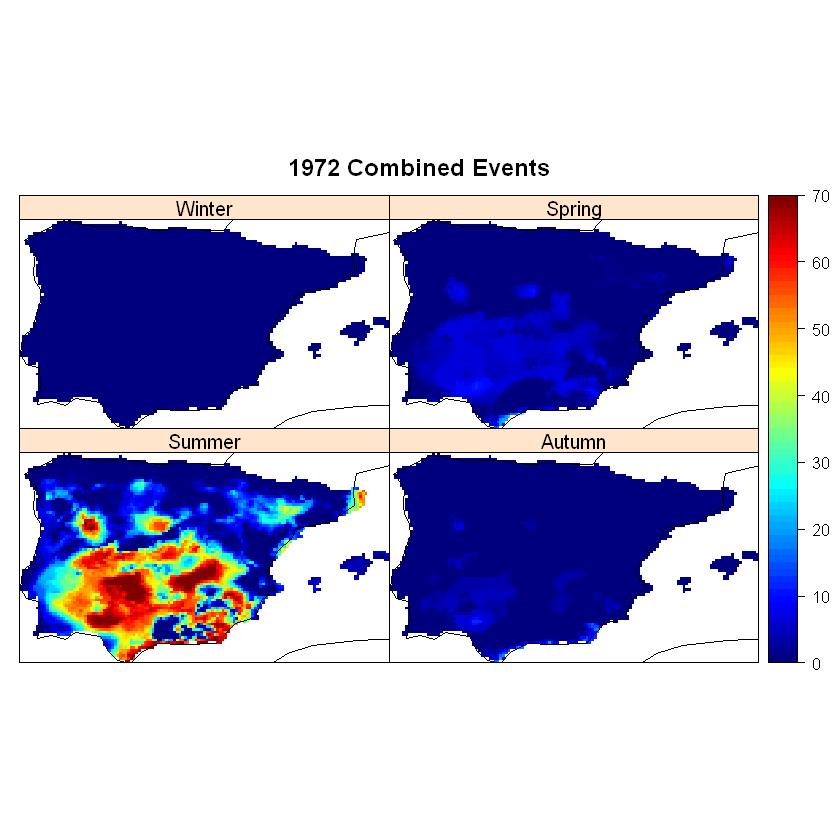

In [5]:
y1972_num <- bindGrid(sum_CE_num$`1972`$Winter, sum_CE_num$`1972`$Spring, sum_CE_num$`1972`$Summer, sum_CE_num$`1972`$Autumn, dimension= "member", skip.temporal.check = TRUE)

spatialPlot(y1972_num, backdrop.theme = "coastline", color.theme = "jet.colors", names.attr = c("Winter", "Spring", "Summer", "Autumn"), main = "1972 Combined Events", set.min = 0, set.max = 70, at = seq(0,70), as.table = TRUE)

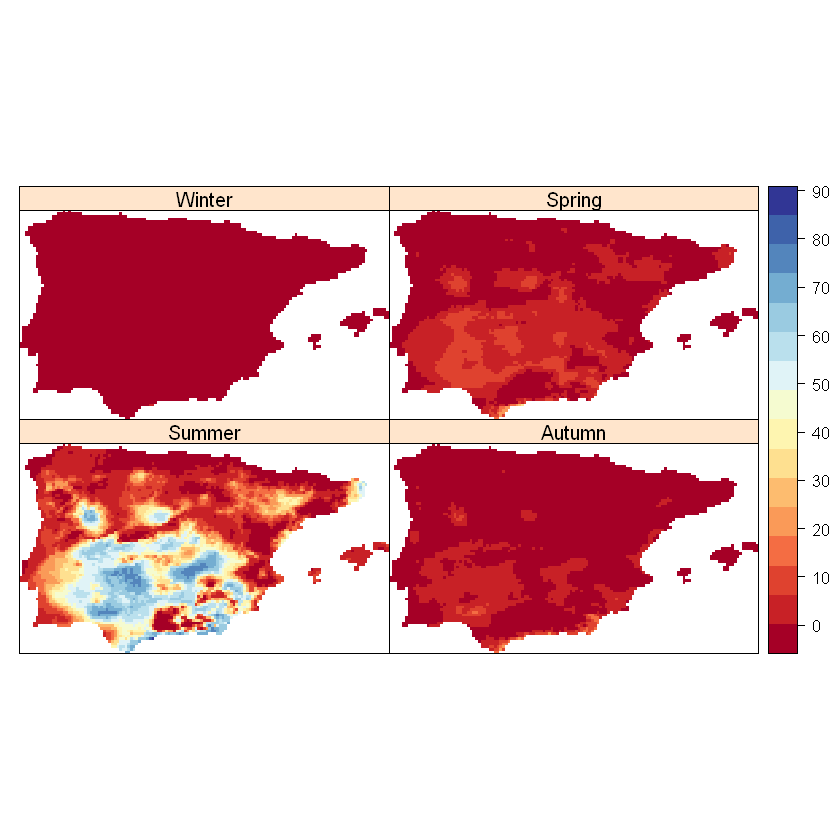

In [6]:
y72 <- bindGrid(sum_CE_num$`1972`$Winter, sum_CE_num$`1972`$Spring, sum_CE_num$`1972`$Summer, sum_CE_num$`1972`$Autumn, dimension = "member", skip.temporal.check = TRUE)
spatialPlot(y72, names.attr = c("Winter", "Spring", "Summer", "Autumn"), as.table =TRUE)

# Function

In [8]:
# Función para realizar bindGrid de una estación específica para varios años
bindGridEstaciones <- function(datos, estacion) {
  # Extraemos los años disponibles en los datos
  years <- names(datos)
  
  # Creamos una lista para almacenar los grids de cada año
  lista_grids <- list()
  
  # Iteramos sobre los años
  for (year in years) {
    # Obtenemos el grid para la estación especificada
    grid <- datos[[year]][[estacion]]
    # Lo añadimos a la lista
    lista_grids[[year]] <- grid
  }
  
  # Realizamos el bindGrid con todos los grids de la lista
  resultado <- bindGrid(lista_grids, dimension = "time", skip.temporal.check = TRUE)
  return(resultado)
}

In [9]:
# Crear un vector con los nombres de las estaciones
estaciones <- c("Winter", "Spring", "Summer", "Autumn")

# Crear una lista para almacenar los resultados
dataPeriod <- list()

# Iterar sobre las estaciones
for (estacion in estaciones) {
  # Obtener los datos para la estación actual
  datos_estacion <- bindGridEstaciones(sum10, estacion = estacion)
  datos_estacion <- climatology(datos_estacion, clim.fun = list(FUN = "sum", na.rm = TRUE))
  datos_estacion <- gridArithmetics(datos_estacion, capa_tierra, operator = "*")
  
  # Almacenar los resultados en la lista
  dataPeriod[[estacion]] <- datos_estacion
}


[2024-03-18 11:44:42] - Computing climatology...
[2024-03-18 11:44:42] - Done.
[2024-03-18 11:44:42] - Computing climatology...
[2024-03-18 11:44:42] - Done.
[2024-03-18 11:44:42] - Computing climatology...
[2024-03-18 11:44:42] - Done.
[2024-03-18 11:44:43] - Computing climatology...
[2024-03-18 11:44:43] - Done.


In [8]:
saveRDS(dataPeriod, "CE10_h_allPeriod.rds", compress = "xz")

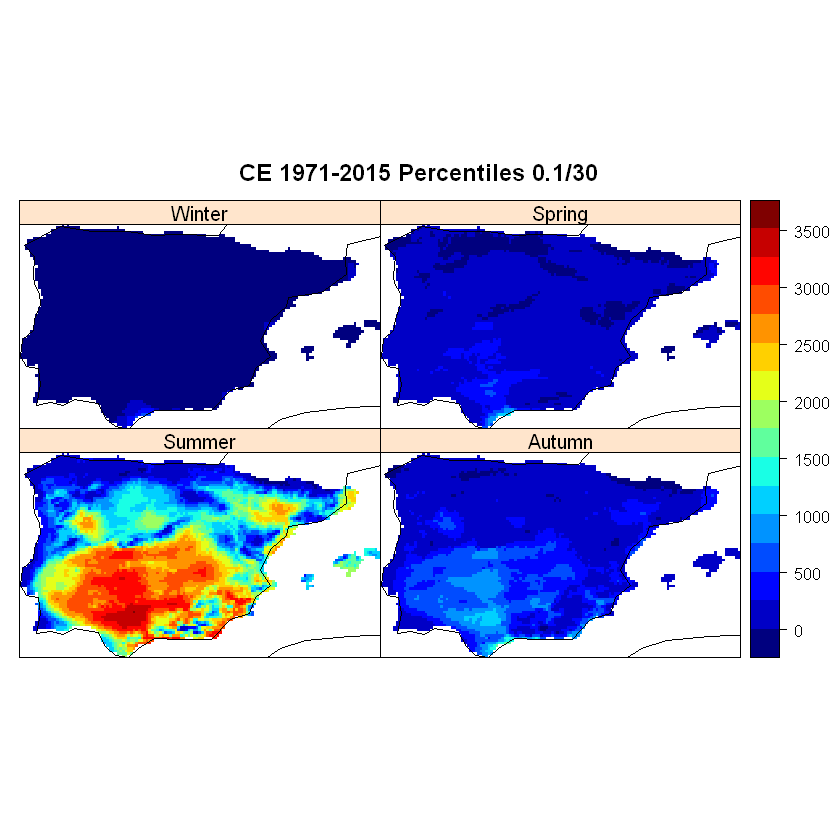

In [10]:
fullPeriod <- bindGrid(dataPeriod$Winter , dataPeriod$Spring, dataPeriod$Summer, dataPeriod$Autumn, dimension = "member", skip.temporal.check = TRUE)
spatialPlot(fullPeriod, backdrop.theme = "coastline", color.theme = "jet.colors", names.attr = c("Winter", "Spring", "Summer", "Autumn"), main = "CE 1971-2015 Percentiles 0.1/30", as.table = TRUE)

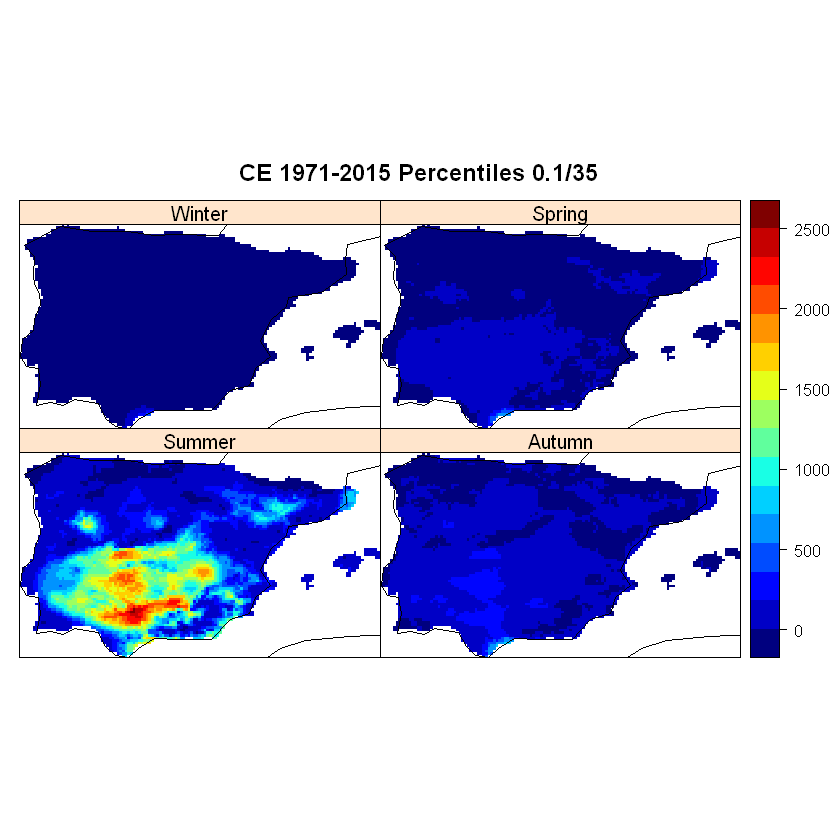

In [6]:
fullPeriod <- bindGrid(dataPeriod$Winter , dataPeriod$Spring, dataPeriod$Summer, dataPeriod$Autumn, dimension = "member", skip.temporal.check = TRUE)
spatialPlot(fullPeriod, backdrop.theme = "coastline", color.theme = "jet.colors", names.attr = c("Winter", "Spring", "Summer", "Autumn"), main = "CE 1971-2015 Percentiles 0.1/35", as.table = TRUE)

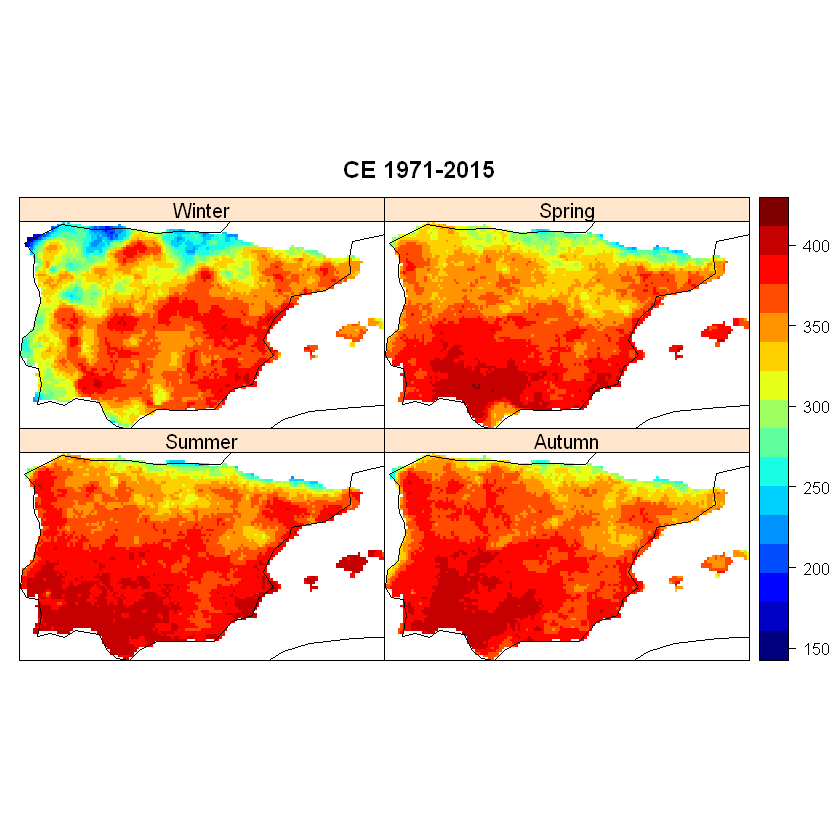

In [12]:
fullPeriod <- bindGrid(dataPeriod$Winter , dataPeriod$Spring, dataPeriod$Summer, dataPeriod$Autumn, dimension = "member", skip.temporal.check = TRUE)
spatialPlot(fullPeriod, backdrop.theme = "coastline", color.theme = "jet.colors", names.attr = c("Winter", "Spring", "Summer", "Autumn"), main = "CE 1971-2015", as.table = TRUE)

Warning message:
"package 'RColorBrewer' was built under R version 3.6.3"

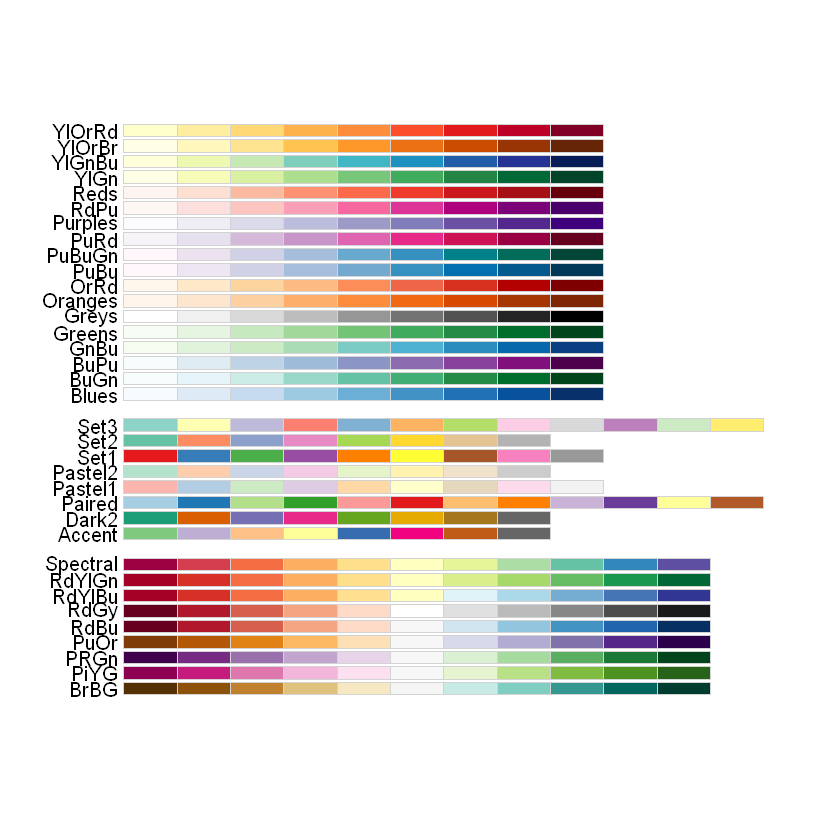

In [40]:
library(RColorBrewer)
display.brewer.all()

## Maps for season Full Period

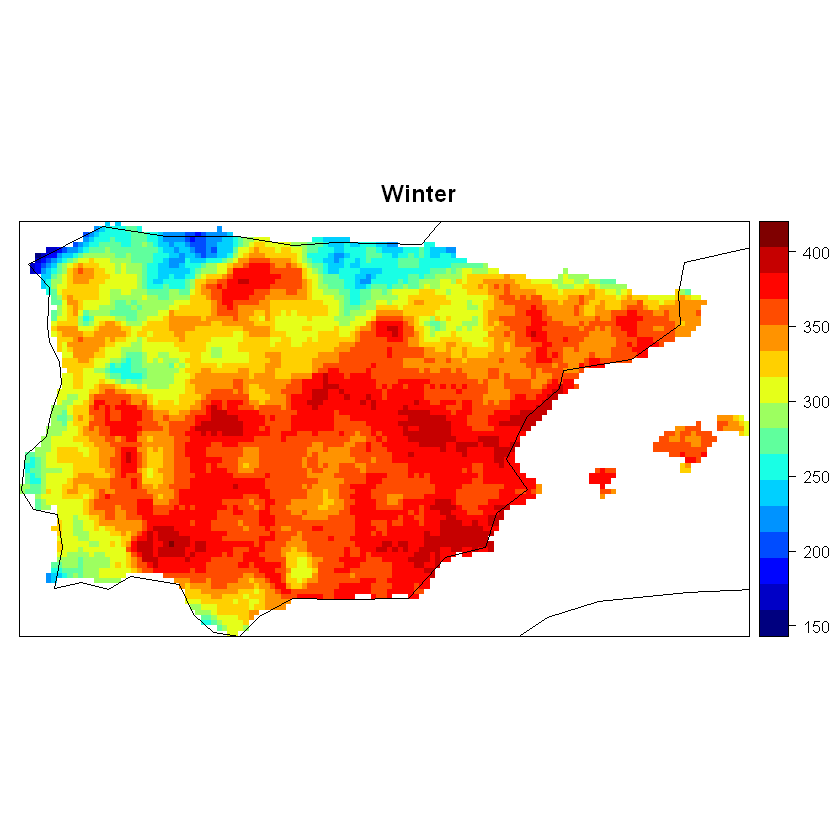

In [14]:
spatialPlot(dataPeriod$Winter, backdrop.theme = "coastline", color.theme = "jet.colors", main = "Winter", as.table = TRUE)

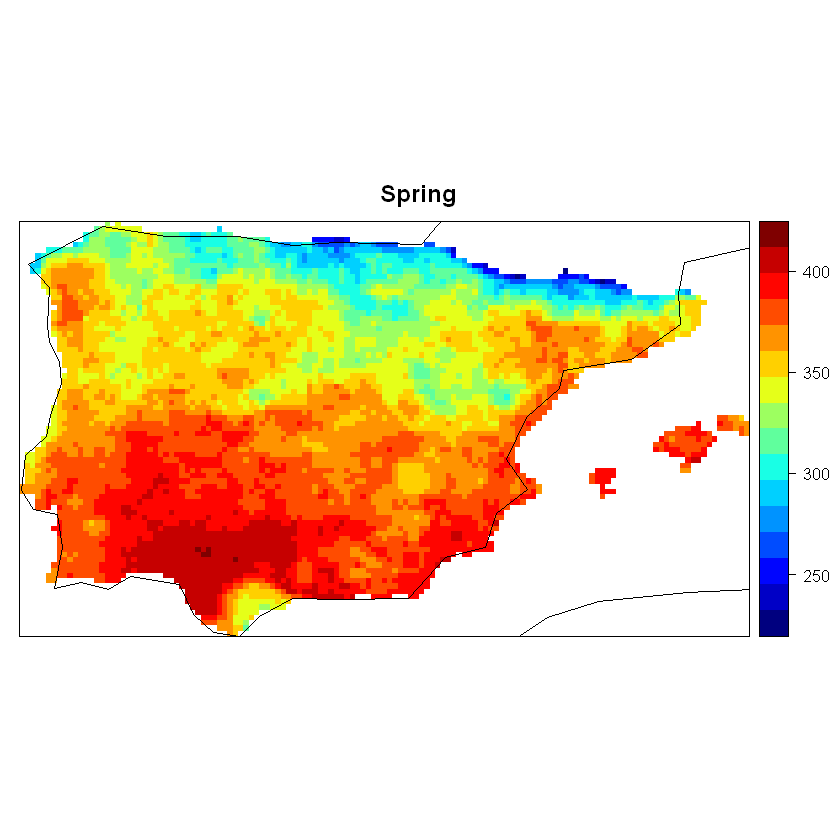

In [15]:
spatialPlot(dataPeriod$Spring, backdrop.theme = "coastline", color.theme = "jet.colors", main = "Spring", as.table = TRUE)

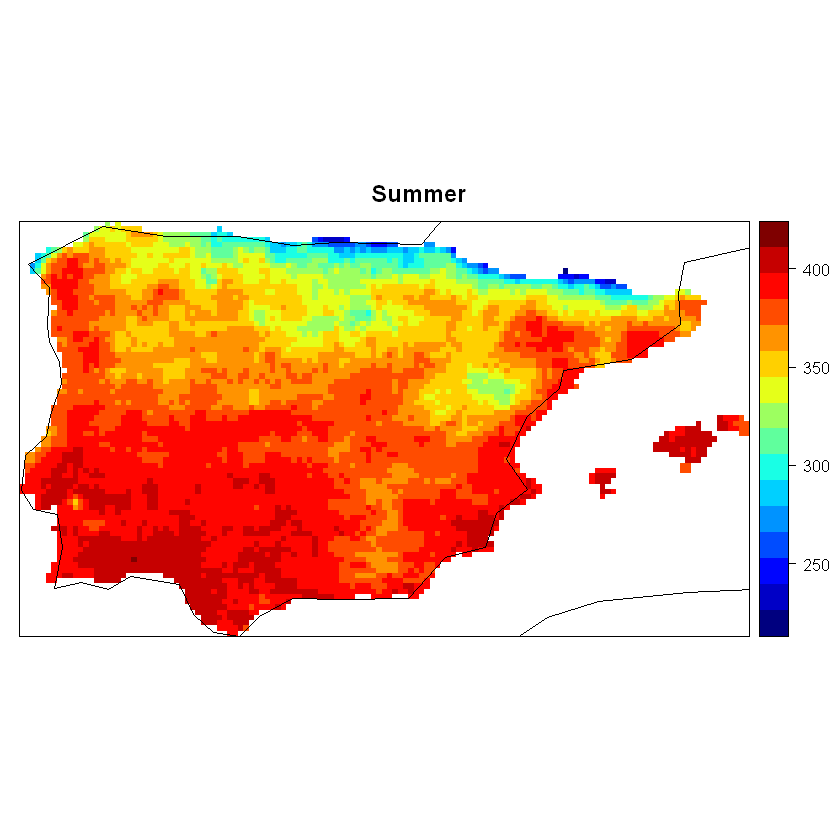

In [16]:
spatialPlot(dataPeriod$Summer, backdrop.theme = "coastline", color.theme = "jet.colors", main = "Summer", as.table = TRUE)

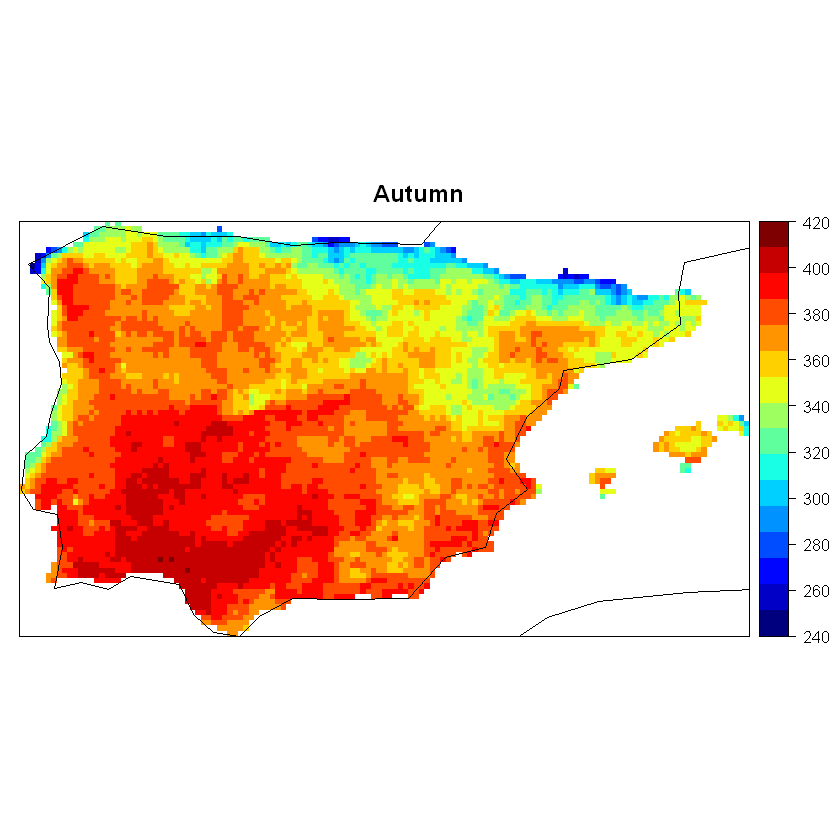

In [17]:
spatialPlot(dataPeriod$Autumn, backdrop.theme = "coastline", color.theme = "jet.colors", main = "Autumn", as.table = TRUE)

# Tendencias (Percentil Ref Num 0.1/30)

## Winter

In [22]:
winter <- bindGridEstaciones(sum10, estacion = "Winter")

[2024-03-18 11:58:01] - Computing climatology...
Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"

Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message 

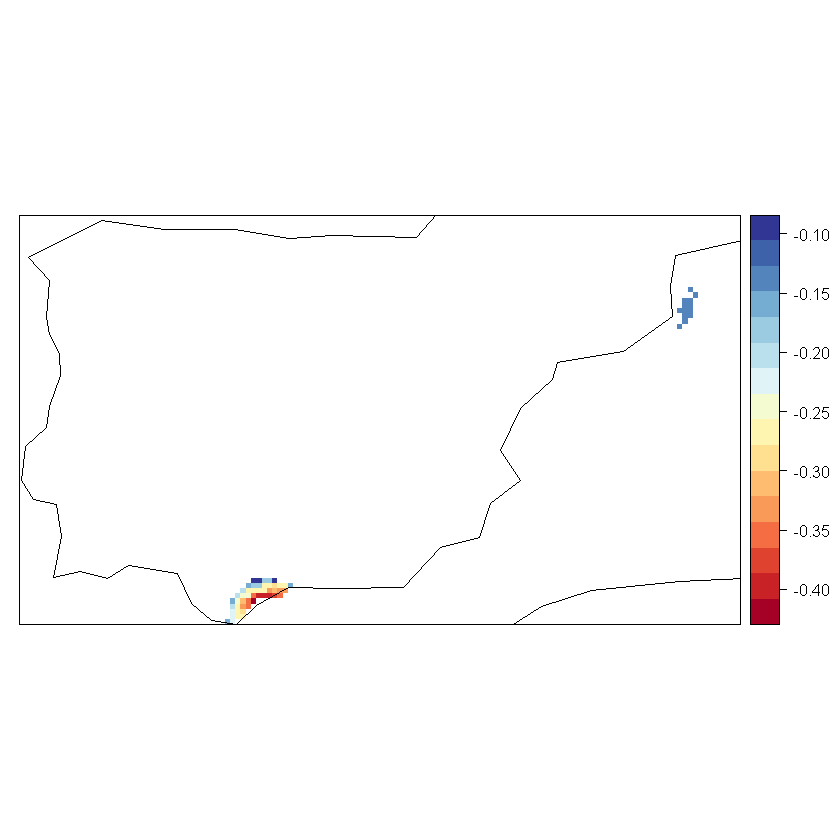

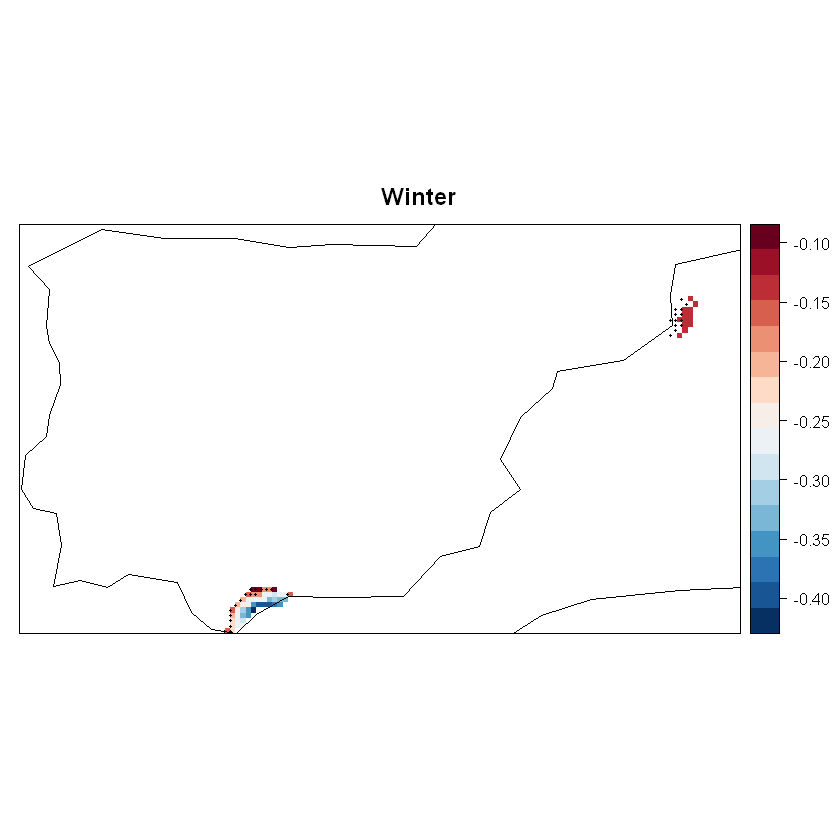

In [23]:
dates.winter <- getRefDates(winter)

tau.winter <- climatology(winter,
                            clim.fun = list(FUN = "trend.1D", dates = dates.winter, method = "kendall"))
spatialPlot(tau.winter, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.winter <- climatology(winter,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.winter,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.winter <- visualizeR::map.stippling(clim = pval.winter, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.winter, backdrop.theme = "coastline", sp.layout = list(points.winter), main = "Winter", color.theme = "RdBu", rev.colors = TRUE)

## Spring

In [24]:
spring <- bindGridEstaciones(sum10, estacion = "Spring")

[2024-03-18 11:59:50] - Computing climatology...
Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"

Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message 

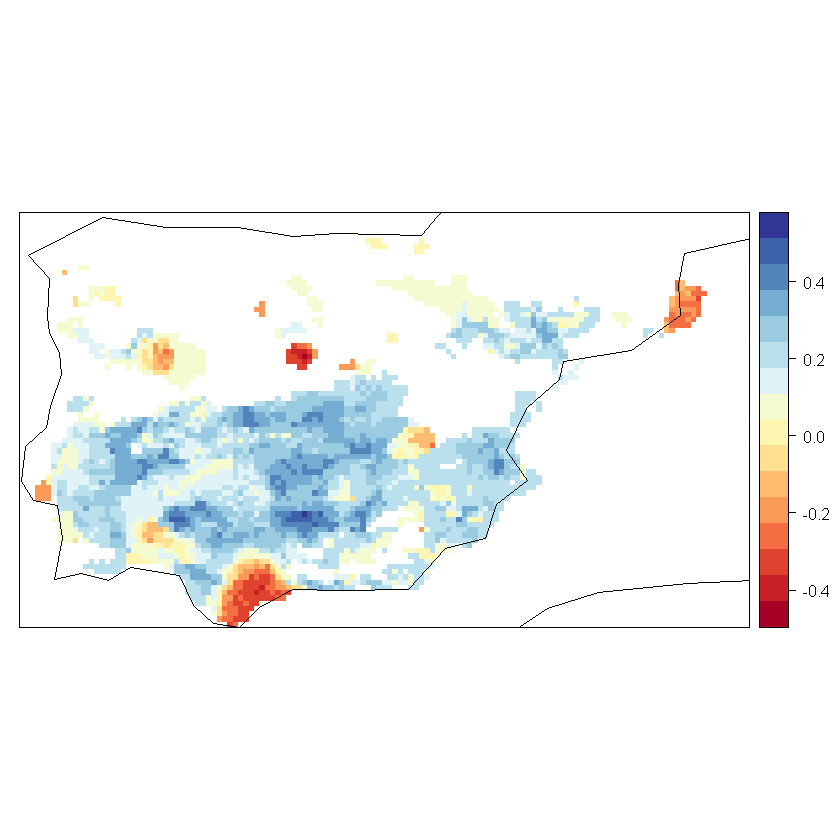

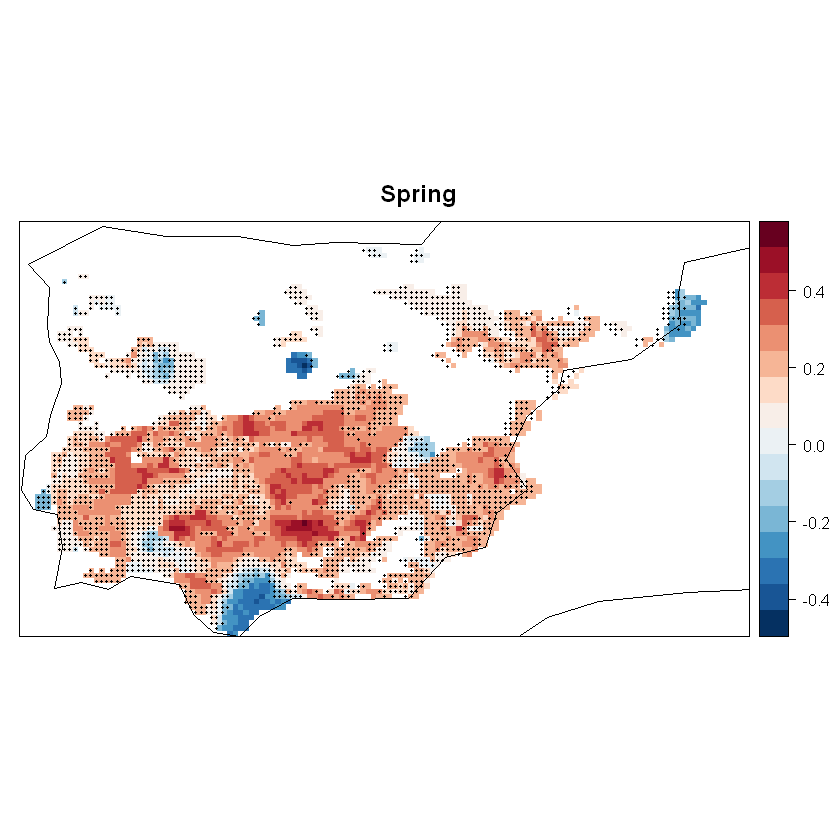

In [25]:
dates.spring <- getRefDates(spring)
tau.spring <- climatology(spring,
                            clim.fun = list(FUN = "trend.1D", dates = dates.spring, method = "kendall"))
spatialPlot(tau.spring, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.spring <- climatology(spring,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.spring,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.spring <- visualizeR::map.stippling(clim = pval.spring, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.spring, backdrop.theme = "coastline", sp.layout = list(points.spring), main = "Spring", color.theme = "RdBu", rev.colors = TRUE)

## Summer

In [26]:
summer <- bindGridEstaciones(sum10, estacion = "Summer")

[2024-03-18 12:03:18] - Computing climatology...
Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"

Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = me

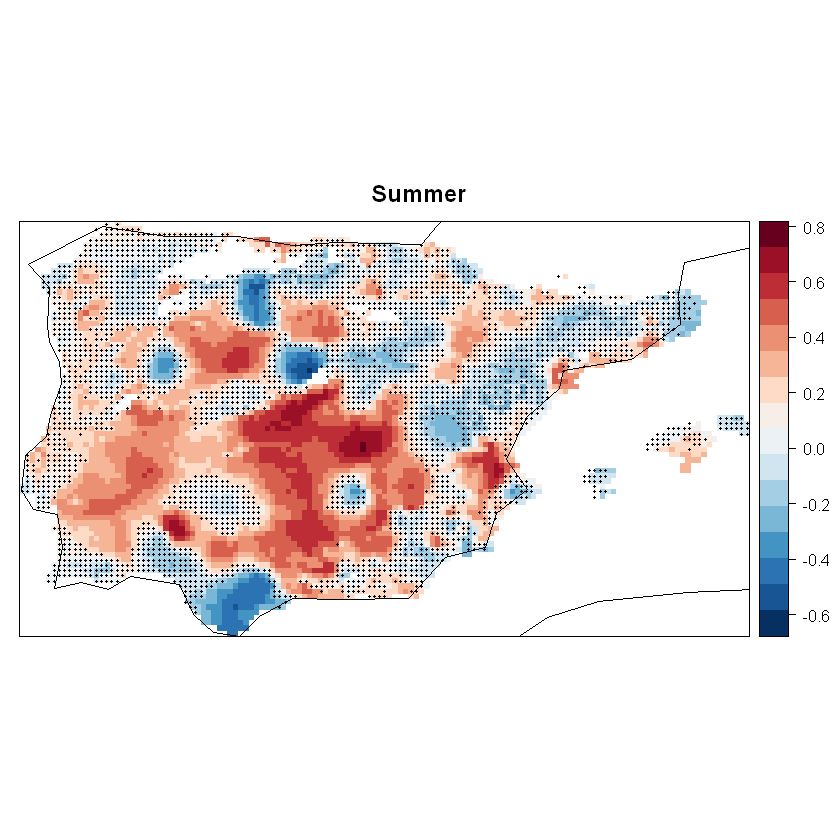

In [27]:
dates.summer <- getRefDates(summer)
tau.summer <- climatology(summer,
                            clim.fun = list(FUN = "trend.1D", dates = dates.summer, method = "kendall"))
# spatialPlot(tau.summer, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.summer <- climatology(summer,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.summer,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.summer <- visualizeR::map.stippling(clim = pval.summer, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.summer, backdrop.theme = "coastline", sp.layout = list(points.summer), main = "Summer", color.theme = "RdBu", rev.colors = TRUE)

## Autumn

In [28]:
autumn <- bindGridEstaciones(sum10, estacion = "Autumn")

[2024-03-18 12:05:59] - Computing climatology...
Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"

Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor(x, y, method = "kendall"):
"the standard deviation is zero"Warning message in cor.test.defa

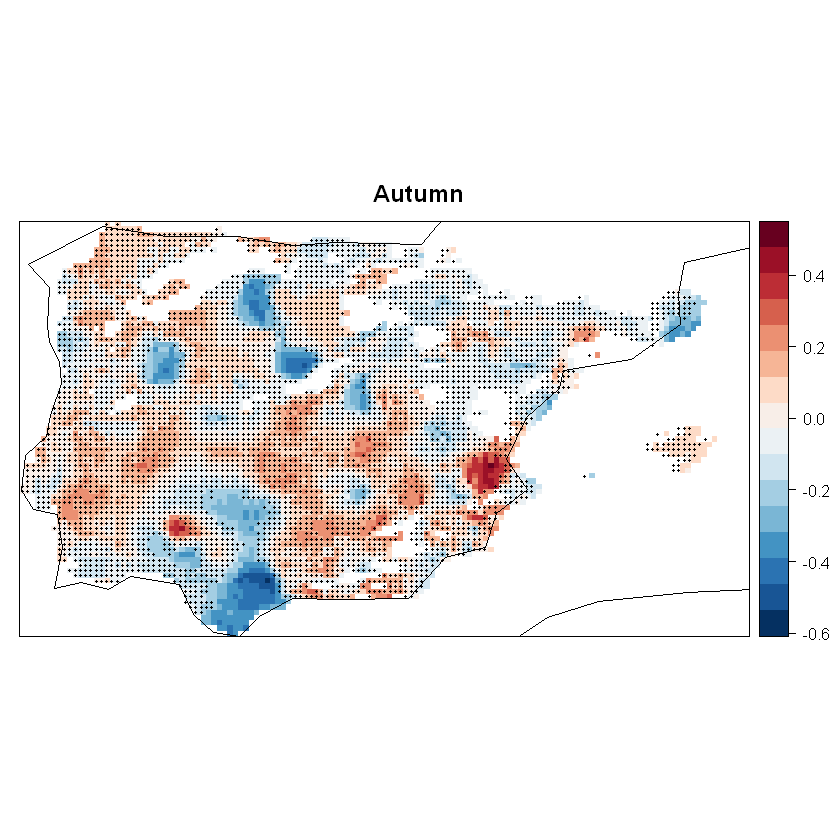

In [29]:
dates.autumn <- getRefDates(autumn)
tau.autumn <- climatology(autumn,
                            clim.fun = list(FUN = "trend.1D", dates = dates.autumn, method = "kendall"))
# spatialPlot(tau.autumn, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.autumn <- climatology(autumn,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.autumn,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.autumn <- visualizeR::map.stippling(clim = pval.autumn, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.autumn, backdrop.theme = "coastline", sp.layout = list(points.autumn), main = "Autumn", color.theme = "RdBu", rev.colors = TRUE)

## All

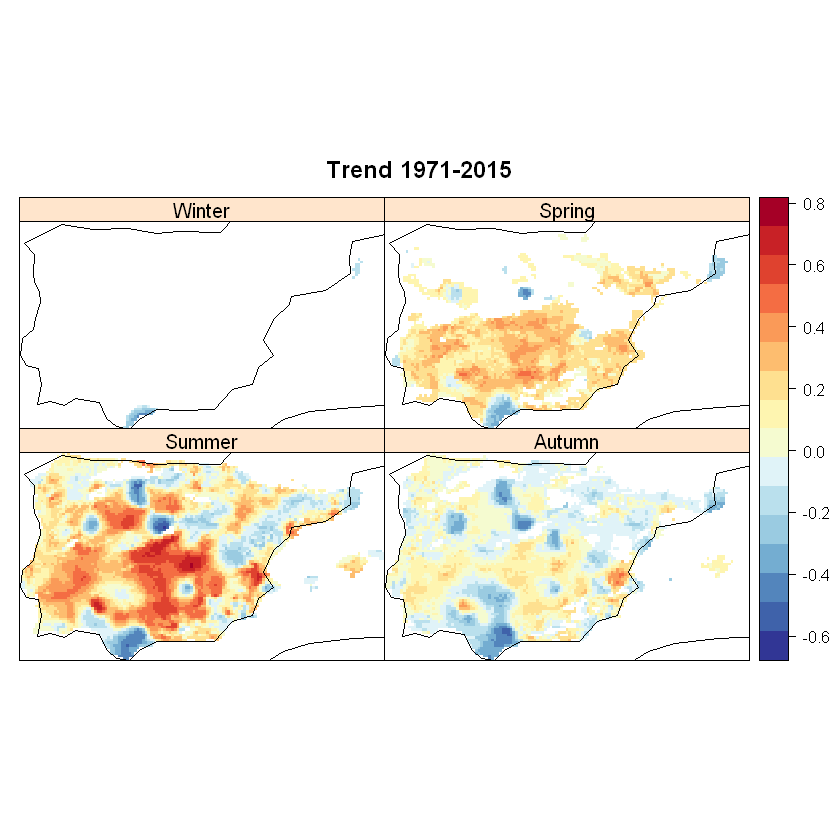

In [30]:
tau <- bindGrid(tau.winter, tau.spring, tau.summer, tau.autumn, dimension = "member", skip.temporal.check = TRUE)
spatialPlot(tau, backdrop.theme = "coastline",   names.attr = c("Winter", "Spring", "Summer", "Autumn"), main = "Trend 1971-2015", colort.theme = "RdBu", rev.colors = TRUE, as.table = TRUE)

# Tendencias (Percentil Ref 10_h)

### Winter

In [19]:
winter <- bindGridEstaciones(sum10, estacion = "Winter")

[2024-03-18 10:58:40] - Computing climatology...
Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning messa

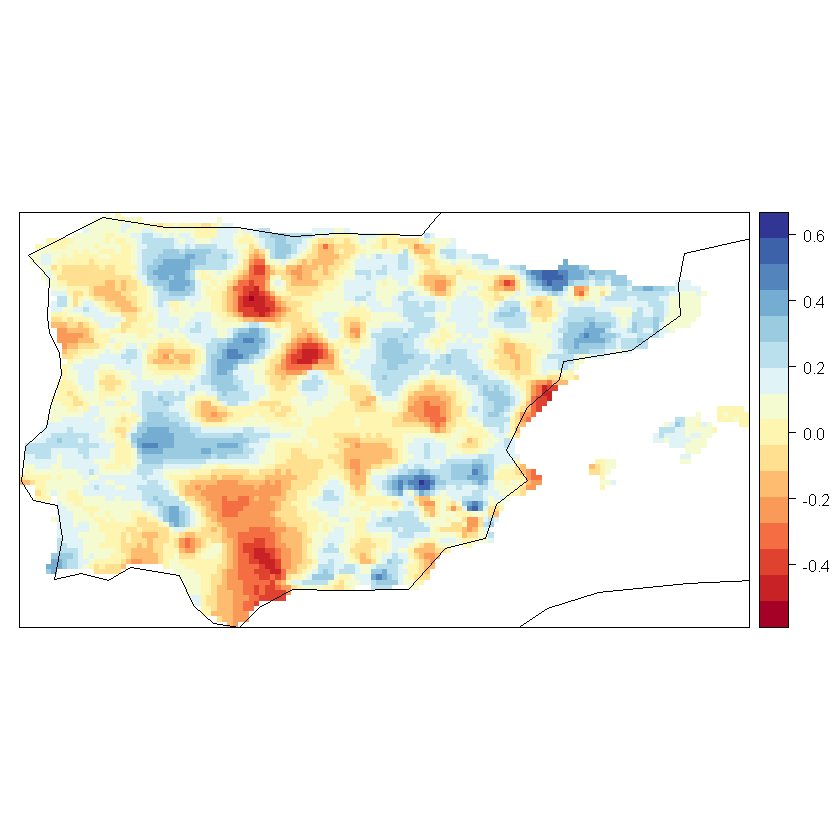

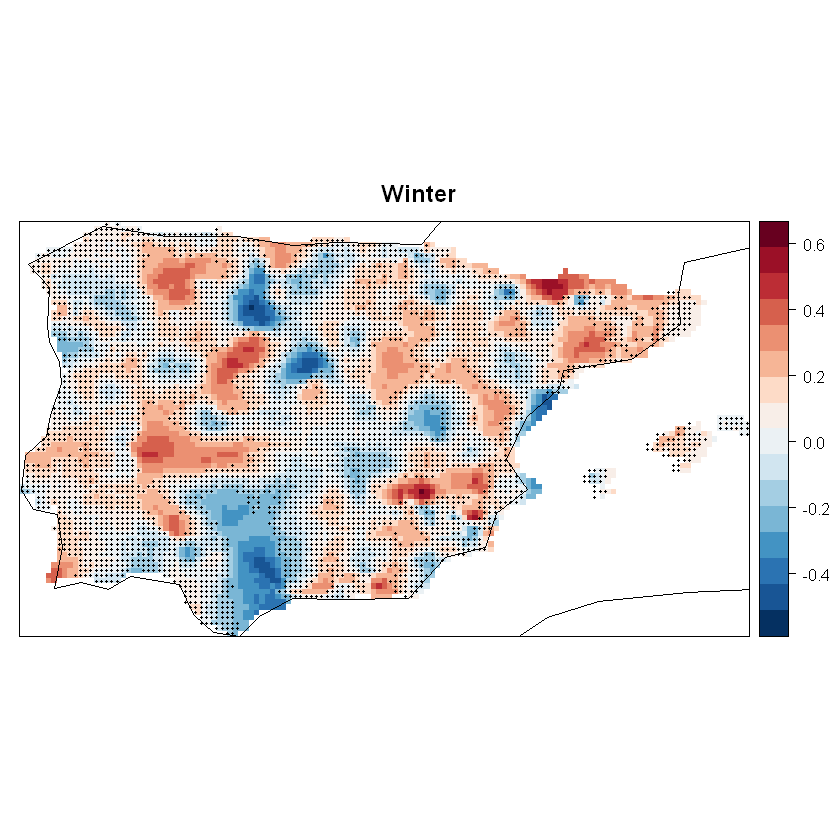

In [23]:
dates.winter <- getRefDates(winter)

tau.winter <- climatology(winter,
                            clim.fun = list(FUN = "trend.1D", dates = dates.winter, method = "kendall"))
spatialPlot(tau.winter, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.winter <- climatology(winter,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.winter,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.winter <- visualizeR::map.stippling(clim = pval.winter, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.winter, backdrop.theme = "coastline", sp.layout = list(points.winter), main = "Winter", color.theme = "RdBu", rev.colors = TRUE)

# hatch.winter <- visualizeR::map.hatching(clim = pval.winter, threshold = 0.05, condition = "LT", 
#                                         pch = 19, cex = .25, col = "black")
# spatialPlot(tau.winter, backdrop.theme = "coastline", sp.layout = list(hatch.winter), main = "Map.Hatching Winter")


### Spring

In [20]:
spring <- bindGridEstaciones(sum10, estacion = "Spring")

[2024-03-18 11:02:13] - Computing climatology...
Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning messa

Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = me

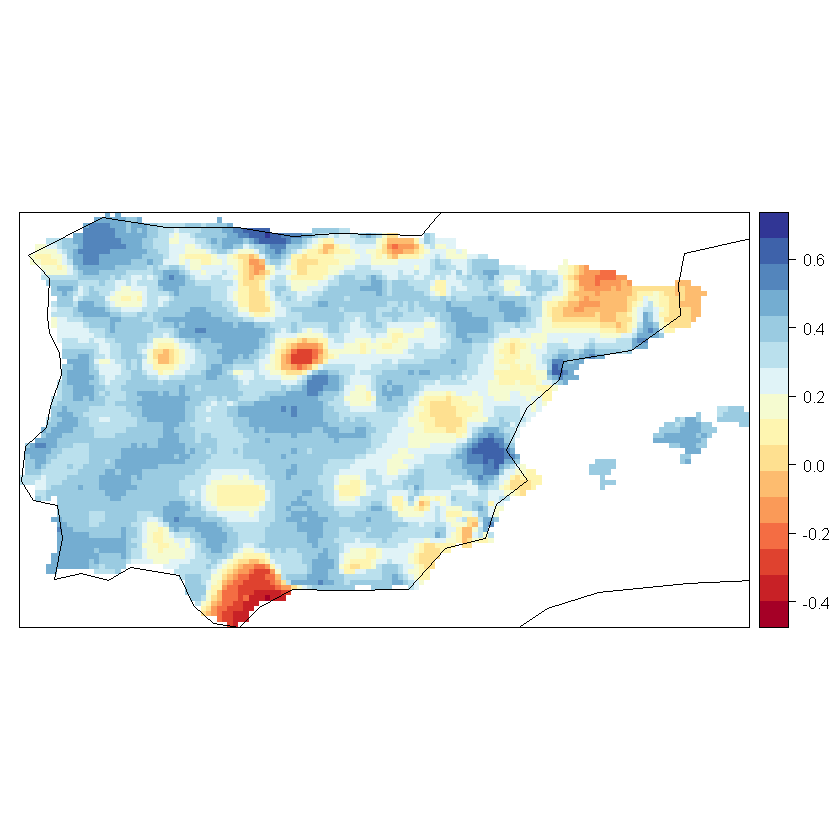

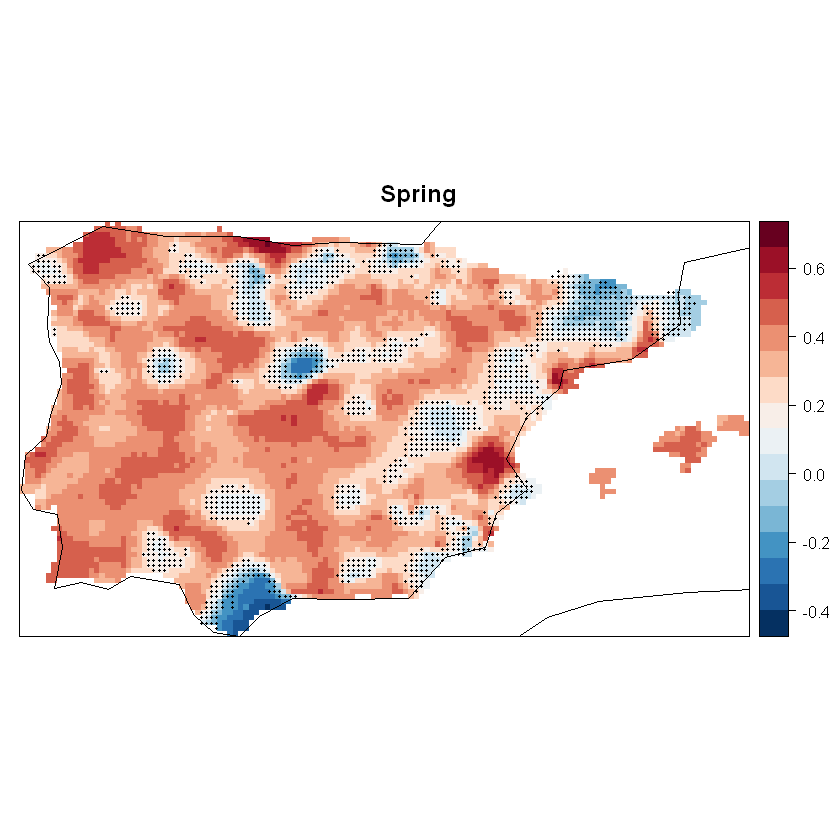

In [24]:
dates.spring <- getRefDates(spring)
tau.spring <- climatology(spring,
                            clim.fun = list(FUN = "trend.1D", dates = dates.spring, method = "kendall"))
spatialPlot(tau.spring, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.spring <- climatology(spring,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.spring,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.spring <- visualizeR::map.stippling(clim = pval.spring, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.spring, backdrop.theme = "coastline", sp.layout = list(points.spring), main = "Spring", color.theme = "RdBu", rev.colors = TRUE)

# hatch.spring <- visualizeR::map.hatching(clim = pval.spring, threshold = 0.05, condition = "LT", 
#                                         pch = 19, cex = .25, col = "black")
# spatialPlot(tau.spring, backdrop.theme = "coastline", sp.layout = list(hatch.spring), main = "Map.Hatching Spring")

### Summer

In [21]:
summer <- bindGridEstaciones(sum10, estacion = "Summer")

[2024-03-18 11:23:05] - Computing climatology...
Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"

Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = me

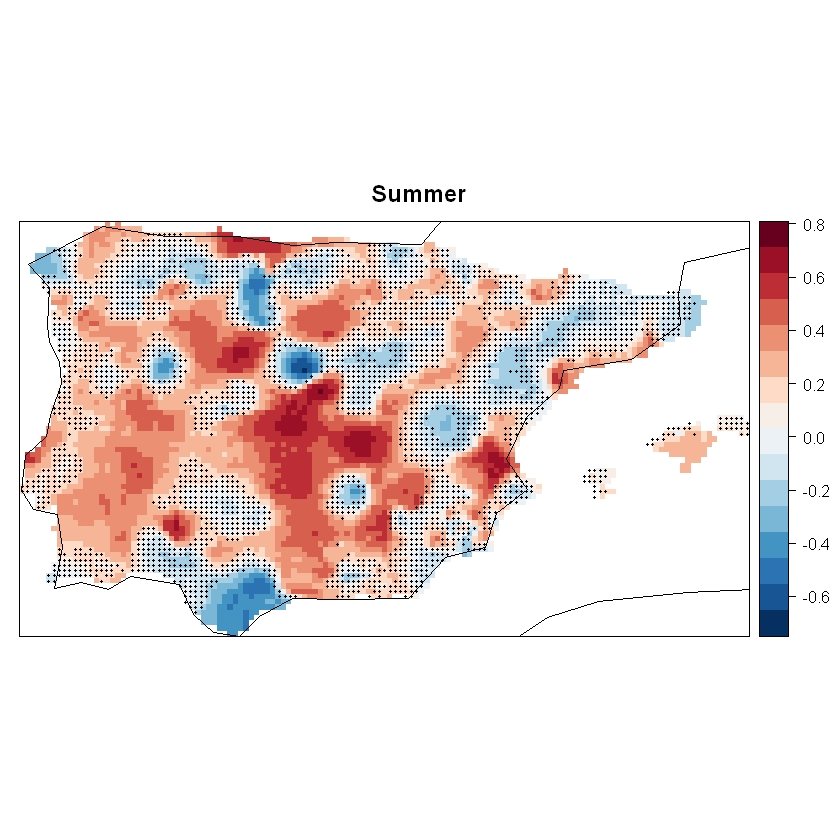

In [30]:
dates.summer <- getRefDates(summer)
tau.summer <- climatology(summer,
                            clim.fun = list(FUN = "trend.1D", dates = dates.summer, method = "kendall"))
# spatialPlot(tau.summer, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.summer <- climatology(summer,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.summer,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.summer <- visualizeR::map.stippling(clim = pval.summer, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.summer, backdrop.theme = "coastline", sp.layout = list(points.summer), main = "Summer", color.theme = "RdBu", rev.colors = TRUE)

# hatch.summer <- visualizeR::map.hatching(clim = pval.summer, threshold = 0.05, condition = "LT", 
#                                         pch = 19, cex = .25, col = "black")
# spatialPlot(tau.summer, backdrop.theme = "coastline", sp.layout = list(hatch.summer), main = "Map.Hatching Summer No Significant")

### Autumn

In [22]:
autumn <- bindGridEstaciones(sum10, estacion = "Autumn")

[2024-03-18 11:13:23] - Computing climatology...
Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning messa

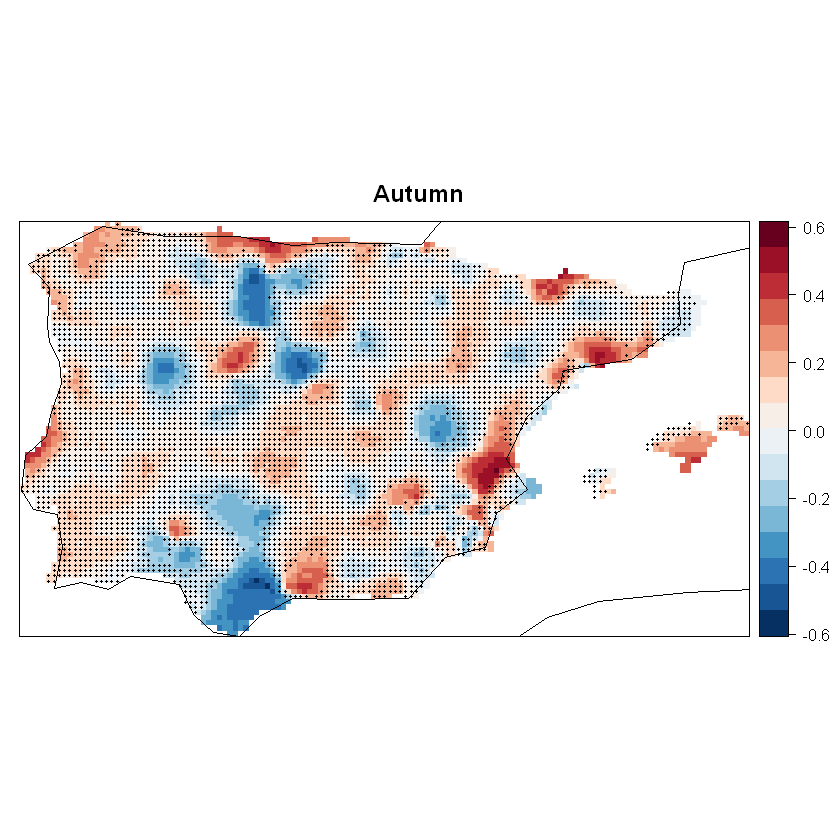

In [26]:
dates.autumn <- getRefDates(autumn)
tau.autumn <- climatology(autumn,
                            clim.fun = list(FUN = "trend.1D", dates = dates.autumn, method = "kendall"))
# spatialPlot(tau.autumn, backdrop.theme = "coastline")
# Adding significant trend points is usually needed: 
pval.autumn <- climatology(autumn,
                            clim.fun = list(FUN = "trend.1D",
                                            dates = dates.autumn,
                                            method = "kendall",
                                            return.pvalue = TRUE))
points.autumn <- visualizeR::map.stippling(clim = pval.autumn, threshold = 0.05, condition = "GE", 
                                        pch = 19, cex = .25, col = "black")
spatialPlot(tau.autumn, backdrop.theme = "coastline", sp.layout = list(points.autumn), main = "Autumn", color.theme = "RdBu", rev.colors = TRUE)

# hatch.autumn <- visualizeR::map.hatching(clim = pval.autumn, threshold = 0.05, condition = "LT", 
#                                         pch = 19, cex = .25, col = "black")
# spatialPlot(tau.autumn, backdrop.theme = "coastline", sp.layout = list(hatch.autumn), main = "Map.Hatching Autumn")

### All

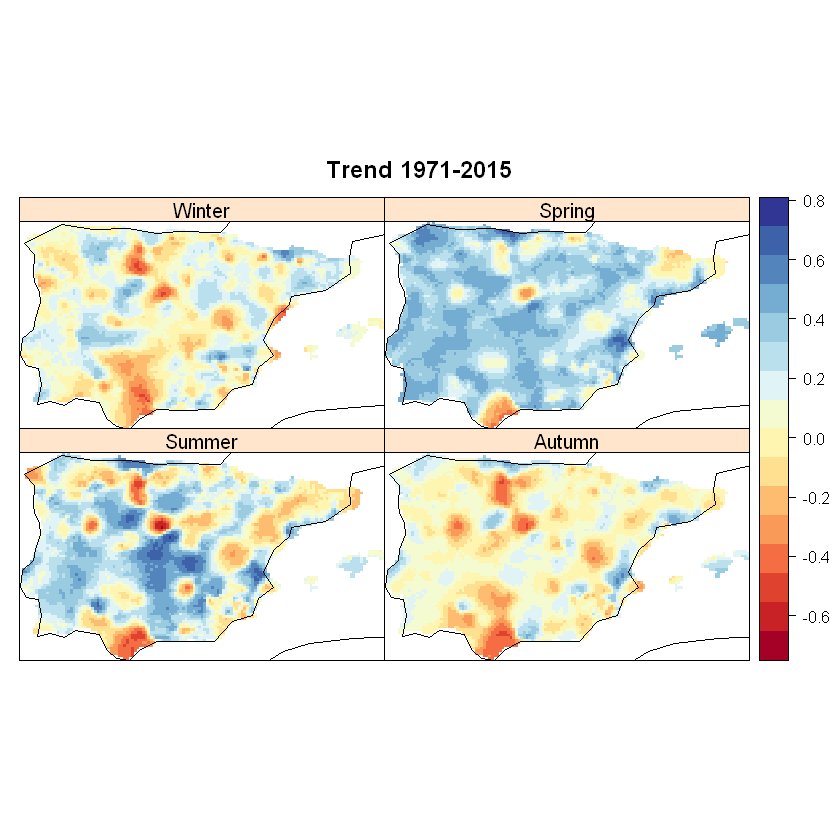

In [28]:
tau <- bindGrid(tau.winter, tau.spring, tau.summer, tau.autumn, dimension = "member", skip.temporal.check = TRUE)
spatialPlot(tau, backdrop.theme = "coastline",   names.attr = c("Winter", "Spring", "Summer", "Autumn"), main = "Trend 1971-2015", as.table = TRUE)

In [6]:
winter <- bindGridEstaciones(sum10, estacion = "Winter")
spring <- bindGridEstaciones(sum10, estacion = "Spring")
autumn <- bindGridEstaciones(sum10, estacion = "Autumn")
summer <- bindGridEstaciones(sum10, estacion = "Summer")

dates.winter <- getRefDates(winter)
dates.spring <- getRefDates(spring)
dates.autumn <- getRefDates(autumn)
dates.summer <- getRefDates(summer)

tau.winter <- climatology(winter, clim.fun = list(FUN = "trend.1D", dates = dates.winter, method = "kendall"))
tau.spring <- climatology(spring, clim.fun = list(FUN = "trend.1D", dates = dates.spring, method = "kendall"))
tau.autumn <- climatology(autumn, clim.fun = list(FUN = "trend.1D", dates = dates.autumn, method = "kendall"))
tau.summer <- climatology(summer, clim.fun = list(FUN = "trend.1D", dates = dates.summer, method = "kendall"))

pval.winter <- climatology(winter, clim.fun = list(FUN = "trend.1D", dates = dates.winter, method = "kendall", return.pvalue = TRUE))
pval.spring <- climatology(spring, clim.fun = list(FUN = "trend.1D", dates = dates.spring, method = "kendall", return.pvalue = TRUE))
pval.autumn <- climatology(autumn, clim.fun = list(FUN = "trend.1D", dates = dates.autumn, method = "kendall", return.pvalue = TRUE))
pval.summer <- climatology(summer, clim.fun = list(FUN = "trend.1D", dates = dates.summer, method = "kendall", return.pvalue = TRUE))

points.winter <- visualizeR::map.stippling(clim = pval.winter, threshold = 0.05, condition = "GE", pch = 19, cex = .25, col = "black")
points.spring <- visualizeR::map.stippling(clim = pval.spring, threshold = 0.05, condition = "GE", pch = 19, cex = .25, col = "black")
points.autumn <- visualizeR::map.stippling(clim = pval.autumn, threshold = 0.05, condition = "GE", pch = 19, cex = .25, col = "black")
points.summer <- visualizeR::map.stippling(clim = pval.summer, threshold = 0.05, condition = "GE", pch = 19, cex = .25, col = "black")

spatialPlot(tau.winter, backdrop.theme = "coastline", sp.layout = list(points.winter), main = "Winter", color.theme = "BuRd", rev.colors = TRUE)
spatialPlot(tau.spring, backdrop.theme = "coastline", sp.layout = list(points.spring), main = "Spring", color.theme = "BuRd", rev.colors = TRUE)
spatialPlot(tau.autumn, backdrop.theme = "coastline", sp.layout = list(points.autumn), main = "Autumn", color.theme = "BuRd", rev.colors = TRUE)
spatialPlot(tau.summer, backdrop.theme = "coastline", sp.layout = list(points.summer), main = "Summer", color.theme = "BuRd", rev.colors = TRUE)


[2024-03-15 13:08:12] - Computing climatology...
Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning message in cor.test.default(x = ts, y = x, method = method, conf.level = conf.level):
"Cannot compute exact p-value with ties"Warning messa

: 